# Multi Class Logistic Regression

Target da 2 den fazla class varsa!

In [2]:
# Data Seti

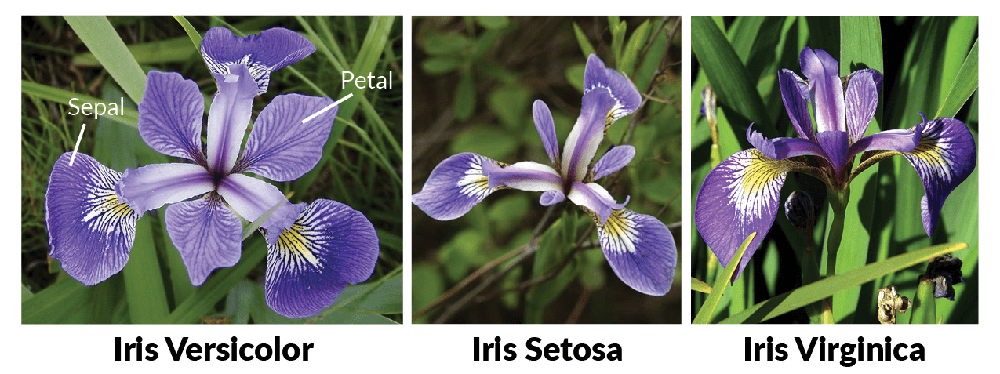

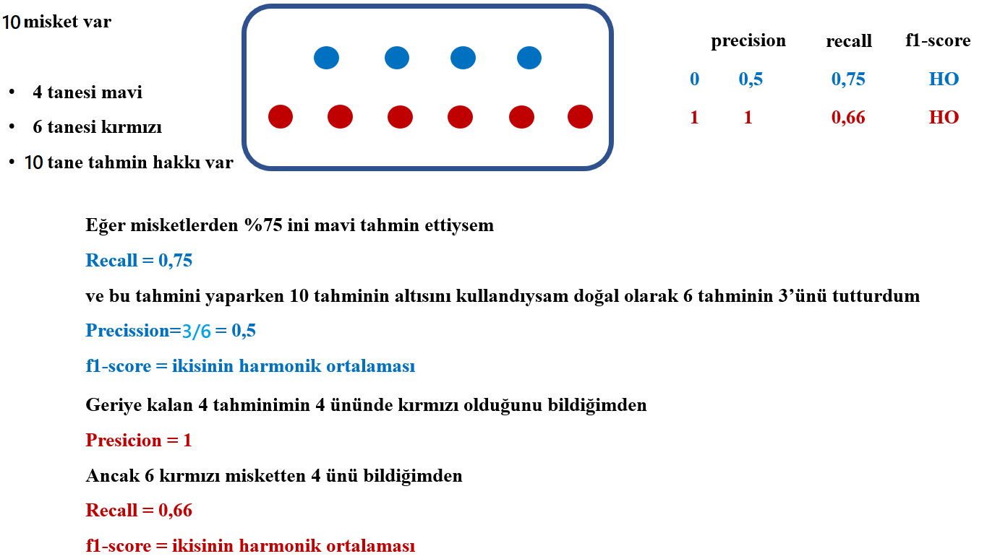

# Import Library

In [77]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib notebook
plt.rcParams["figure.figsize"] = (10,6)
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [4]:
df = pd.read_csv("iris.csv")
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.100,3.500,1.400,0.200,setosa
1,4.900,3.000,1.400,0.200,setosa
2,4.700,3.200,1.300,0.200,setosa
3,4.600,3.100,1.500,0.200,setosa
4,5.000,3.600,1.400,0.200,setosa


# EDA

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  150 non-null    float64
 1   sepal_width   150 non-null    float64
 2   petal_length  150 non-null    float64
 3   petal_width   150 non-null    float64
 4   species       150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sepal_length,150.000,5.843,0.828,4.300,5.100,5.800,6.400,7.900
sepal_width,150.000,3.057,0.436,2.000,2.800,3.000,3.300,4.400
petal_length,150.000,3.758,1.765,1.000,1.600,4.350,5.100,6.900
petal_width,150.000,1.199,0.762,0.100,0.300,1.300,1.800,2.500


In [7]:
df["species"].value_counts()

setosa        50
versicolor    50
virginica     50
Name: species, dtype: int64

Lokum gibi data balans oldugunu da ispatlar

<IPython.core.display.Javascript object>


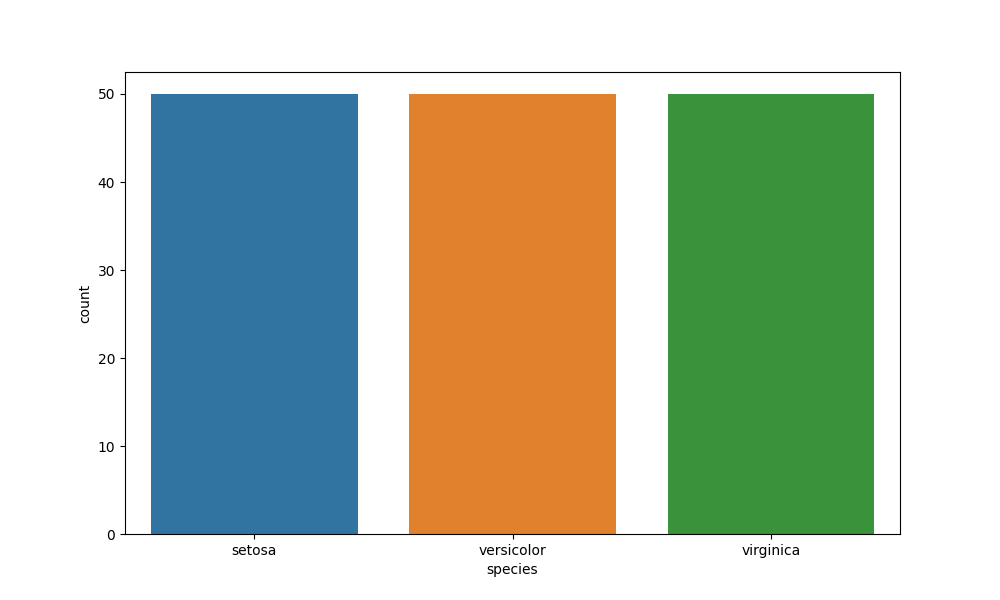

In [8]:
sns.countplot(df["species"]);

<IPython.core.display.Javascript object>


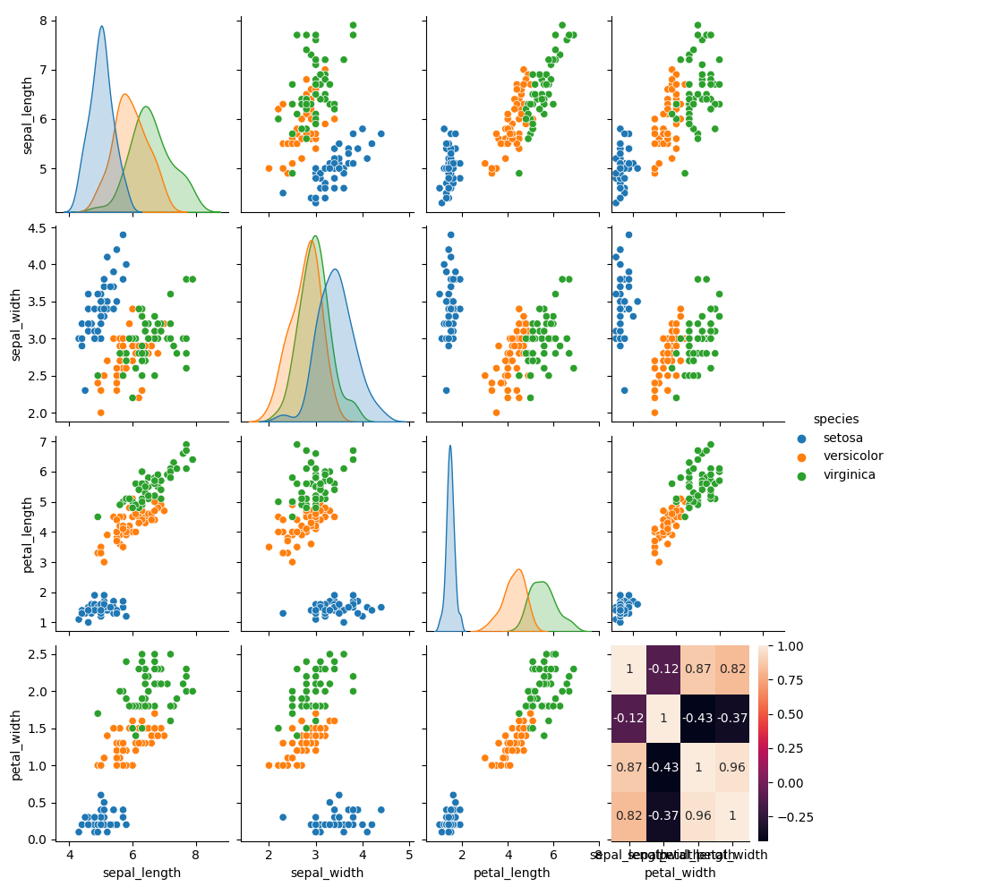

In [9]:
sns.pairplot(df, hue = "species"); ## Classification modellerde hue ya hep target vereceğiz.

In [10]:
sns.heatmap(df.corr(), annot = True)

<AxesSubplot:>

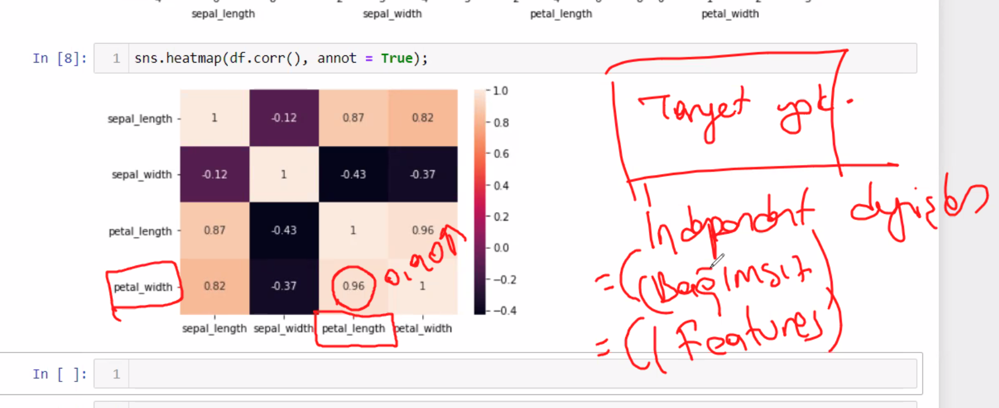

In [78]:
#print(pd.__version__)

1.4.3


In [79]:
#print(np.__version__)

1.23.1


In [ ]:
print(np.__version__)

In [11]:
from mpl_toolkits.mplot3d import Axes3D

<IPython.core.display.Javascript object>


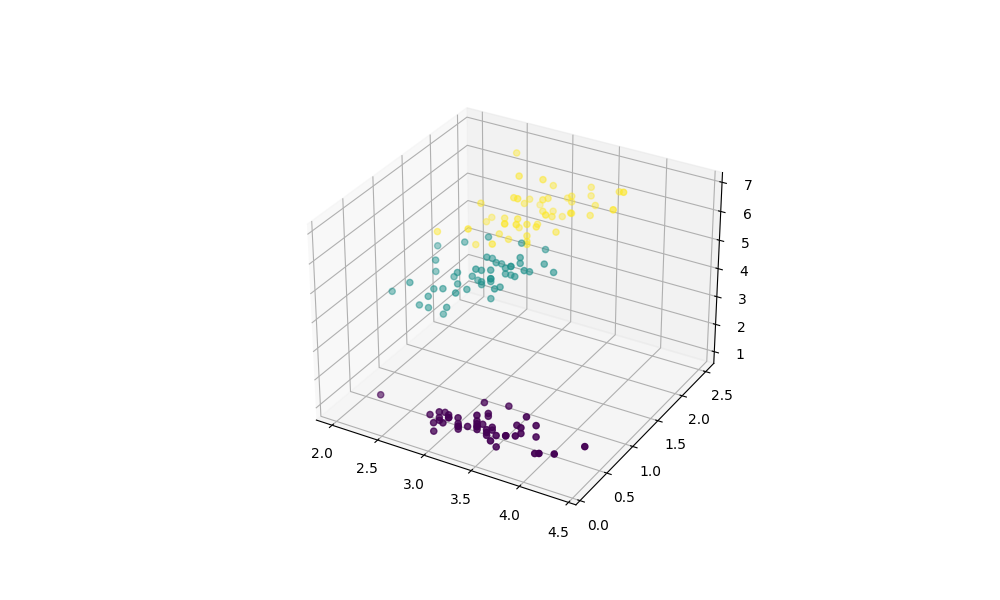

In [12]:
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
colors = df["species"].map({"setosa":0, "versicolor":1, "virginica":2})
ax.scatter(df["sepal_width"], df["petal_width"], df["petal_length"], c=colors);

In [13]:
# pip install plotly

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 23.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
import plotly.express as px
colors = df["species"].map({"setosa":0, "versicolor":1, "virginica":2})
fig = px.scatter_3d(df, x="sepal_width", y="petal_width", z="petal_length", color=colors)
fig.show()

# Train | Test Split

In [15]:
X = df.drop("species", axis = 1)
y = df["species"]

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.10, random_state=101)

# Scaling

In [18]:
scaler = StandardScaler()

In [19]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Modeling and Model Performance

In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, plot_confusion_matrix

## With Default Parameters

In [22]:
log_model = LogisticRegression()

In [23]:
log_model.fit(X_train_scaled, y_train)
y_pred = log_model.predict(X_test_scaled)
y_pred

array(['setosa', 'setosa', 'setosa', 'virginica', 'versicolor',
       'virginica', 'versicolor', 'versicolor', 'virginica', 'setosa',
       'virginica', 'setosa', 'setosa', 'virginica', 'virginica'],
      dtype=object)

##  Proba

In [24]:
y_pred_proba = log_model.predict_proba(X_test_scaled)
y_pred_proba

array([[9.96601603e-01, 3.39838927e-03, 7.24280050e-09],
       [9.90794216e-01, 9.20572460e-03, 5.95136593e-08],
       [9.72841677e-01, 2.71572021e-02, 1.12097637e-06],
       [1.73828522e-04, 3.34122819e-01, 6.65703353e-01],
       [4.65175297e-03, 8.76730762e-01, 1.18617485e-01],
       [6.22660609e-04, 3.21544110e-01, 6.77833230e-01],
       [5.47577557e-04, 6.27052369e-01, 3.72400053e-01],
       [8.97470185e-03, 8.87509111e-01, 1.03516187e-01],
       [1.34206119e-04, 1.71782466e-01, 8.28083327e-01],
       [9.38861402e-01, 6.11379836e-02, 6.14034535e-07],
       [3.47590629e-04, 1.59520180e-01, 8.40132230e-01],
       [9.97466618e-01, 2.53337775e-03, 4.74757383e-09],
       [9.41035218e-01, 5.89638423e-02, 9.39861795e-07],
       [5.02485489e-07, 1.94206860e-02, 9.80578811e-01],
       [3.26058524e-03, 3.98605555e-01, 5.98133860e-01]])

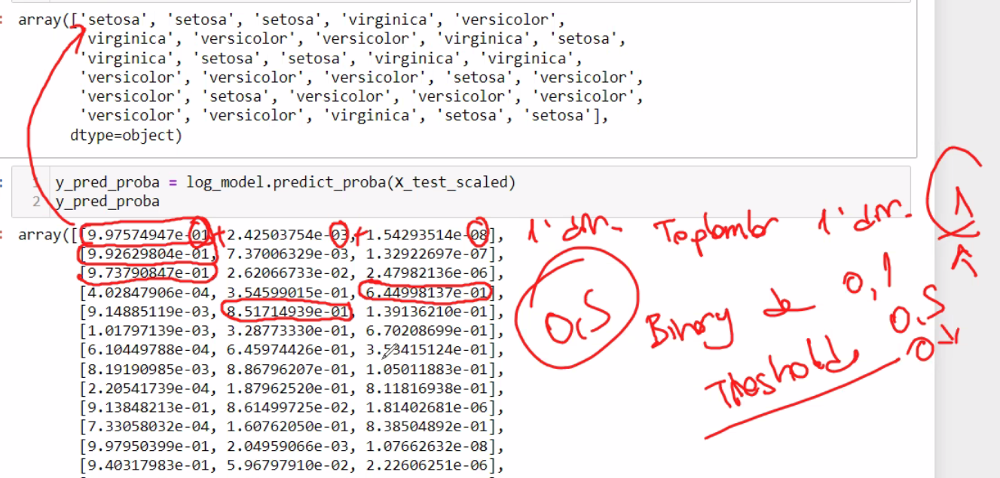

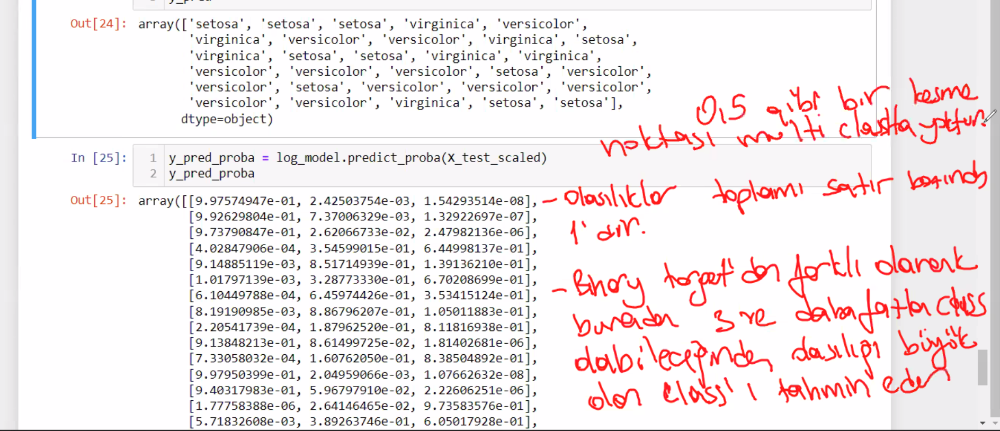

<IPython.core.display.Javascript object>


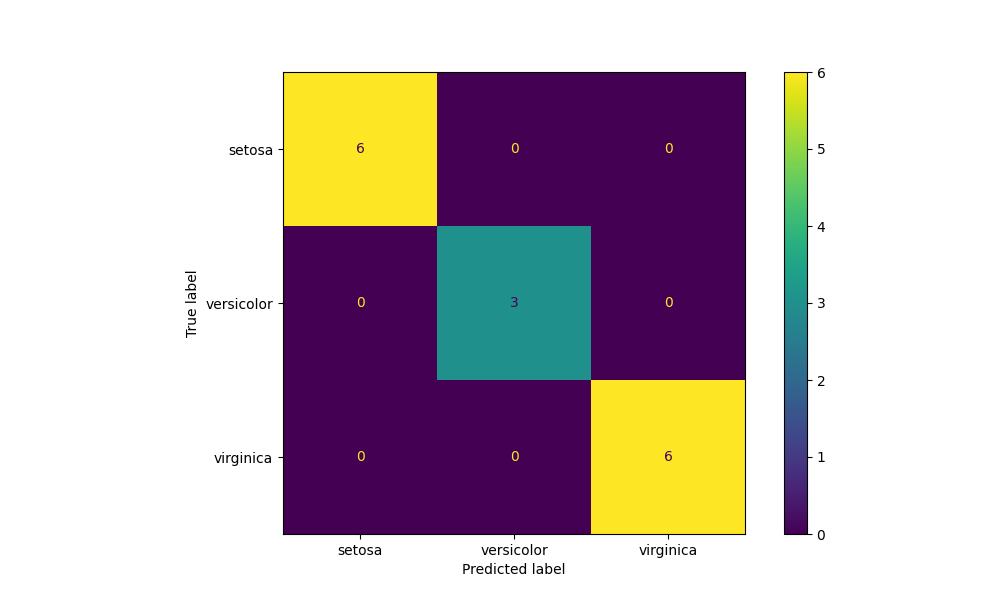

In [27]:
plot_confusion_matrix(log_model, X_test_scaled, y_test);

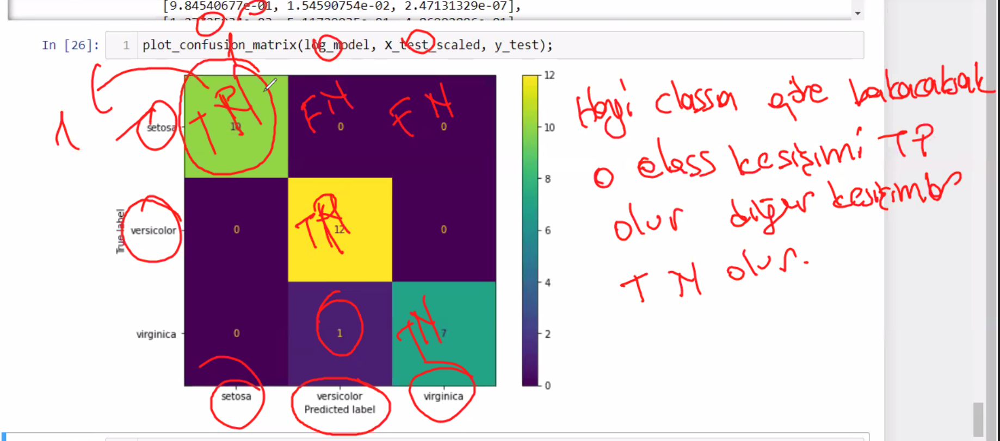

Multi class bir modelde hangi classa göre confusion matrix e bakıytorsak o class ın kesişimleri True Pozitif olur diğer class ların kesişimleri ise True Negatif olaru seçtiğimiz class 1 diğerleri 0 gibi düşünmelşiyiz.

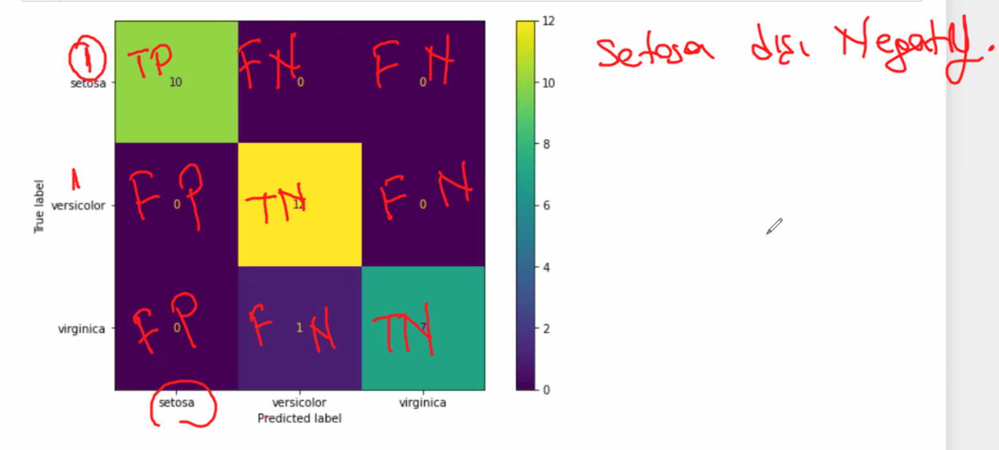

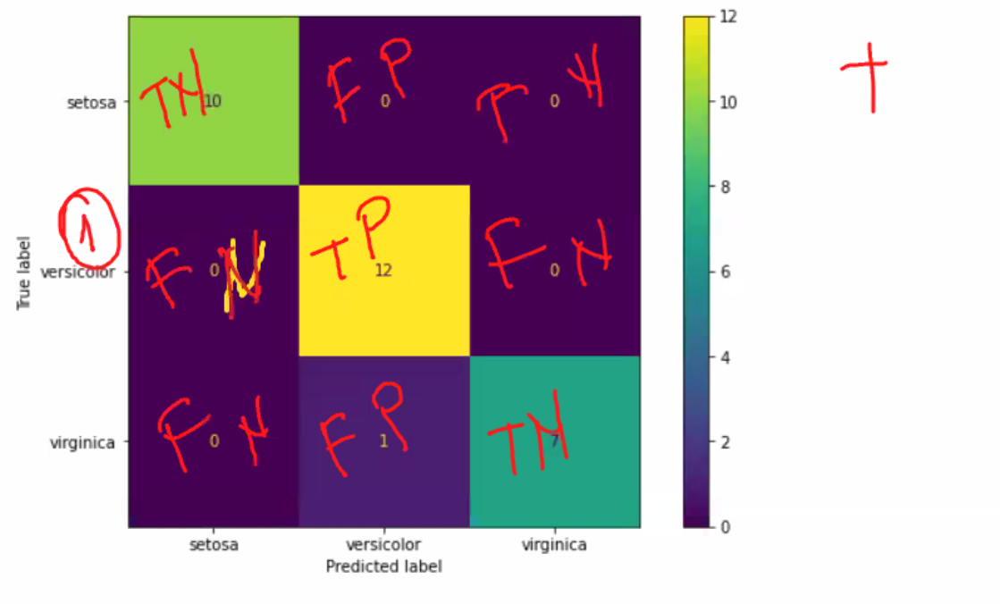

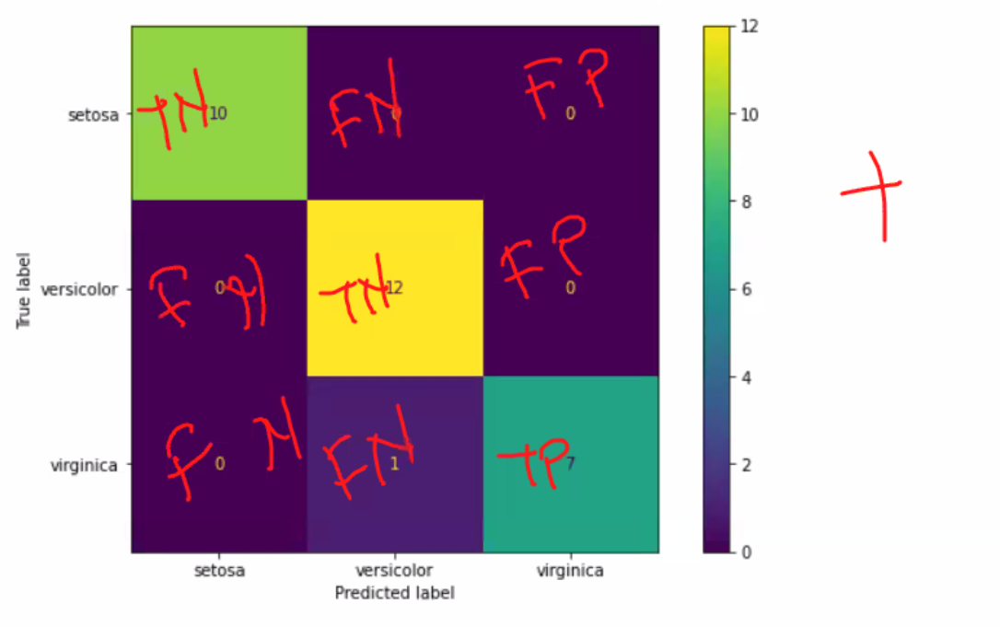

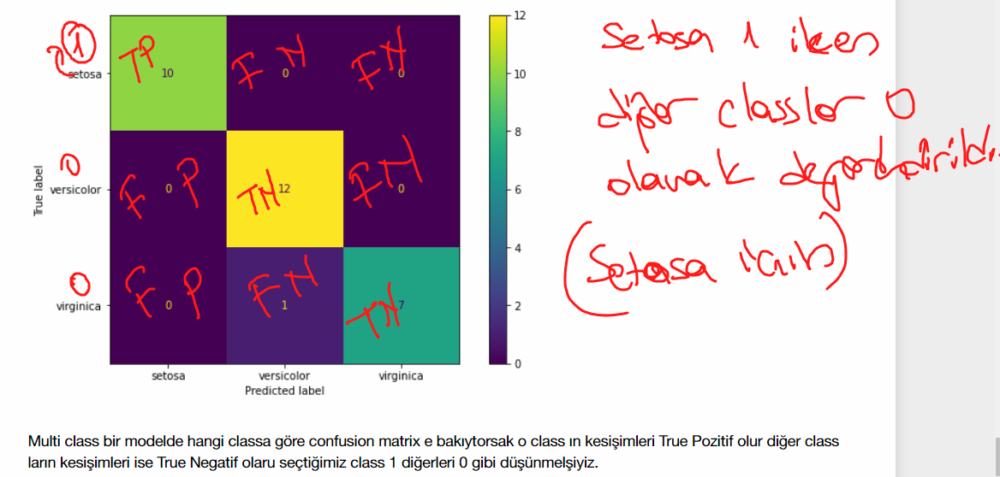

In [25]:
# test_data = pd.concat([X_test, y_test], axis = 1)
# test_data

,sepal_length,sepal_width,petal_length,petal_width,species
33,5.500,4.200,1.400,0.200,setosa
16,5.400,3.900,1.300,0.400,setosa
43,5.000,3.500,1.600,0.600,setosa
129,7.200,3.000,5.800,1.600,virginica
50,7.000,3.200,4.700,1.400,versicolor
123,6.300,2.700,4.900,1.800,virginica
68,6.200,2.200,4.500,1.500,versicolor
53,5.500,2.300,4.000,1.300,versicolor
146,6.300,2.500,5.000,1.900,virginica
1,4.900,3.000,1.400,0.200,setosa


In [29]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [30]:
eval_metric(log_model, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[6 0 0]
 [0 3 0]
 [0 0 6]]
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00         6
  versicolor       1.00      1.00      1.00         3
   virginica       1.00      1.00      1.00         6

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15


Train_Set
[[44  0  0]
 [ 0 44  3]
 [ 0  1 43]]
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        44
  versicolor       0.98      0.94      0.96        47
   virginica       0.93      0.98      0.96        44

    accuracy                           0.97       135
   macro avg       0.97      0.97      0.97       135
weighted avg       0.97      0.97      0.97       135



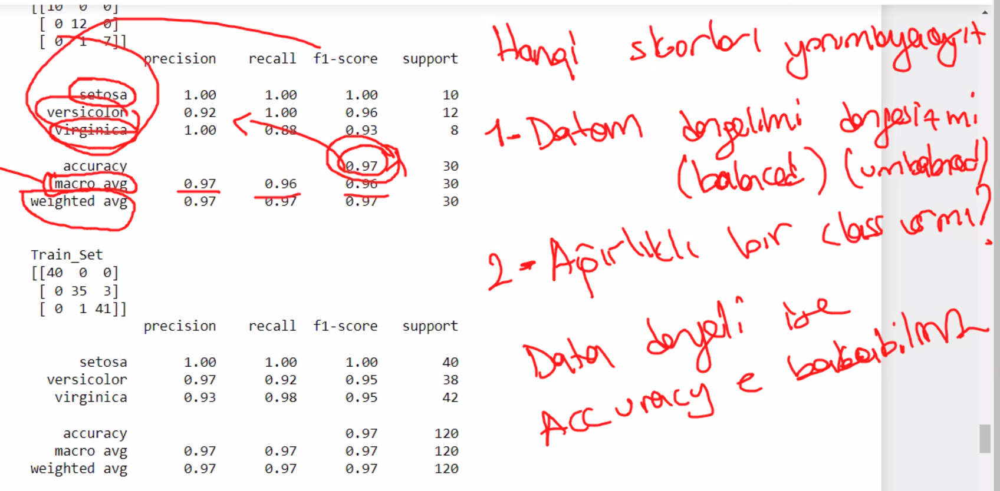

%20 

# Cross Validate

In [31]:
from sklearn.model_selection import cross_validate
model = LogisticRegression()
scores = cross_validate(model, X_train_scaled, y_train, scoring = ['accuracy', 'precision_weighted','recall_weighted',
                                                                   'f1_weighted'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_accuracy             0.955
test_precision_weighted   0.963
test_recall_weighted      0.955
test_f1_weighted          0.954
dtype: float64

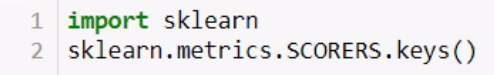

# Sectigimiz bir class a gore (Versicolor) gore Cross Validate

In [32]:
from sklearn.metrics import make_scorer
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
f1_versicolor = make_scorer(f1_score, average = None, labels =["versicolor"]) # Labels gelirse average.....
precision_versicolor = make_scorer(precision_score, average = None, labels =["versicolor"])
recall_versicolor = make_scorer(recall_score, average = None, labels =["versicolor"])

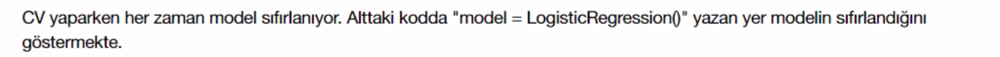

In [33]:
model = LogisticRegression() # model sifirlandi
scores = cross_validate(model, X_train_scaled, y_train, scoring = {"f1_versicolor":f1_versicolor,
                                                                   "precision_versicolor":precision_versicolor,
                                                                   "recall_versicolor":recall_versicolor}, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]
scores = cross_validate(model, X_train_scaled, y_train, scoring = {"f1_versicolor":f1_versicolor,
                                                                   "precision_versicolor":precision_versicolor,
                                                                   "recall_versicolor":recall_versicolor}, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_f1_versicolor          0.935
test_precision_versicolor   0.933
test_recall_versicolor      0.950
dtype: float64

# Proba

In [34]:
y_pred=log_model.predict(X_test_scaled)
y_pred_proba = log_model.predict_proba(X_test_scaled)

test_data = pd.concat([X_test, y_test], axis=1)
test_data["pred"] = y_pred
test_data["pred_proba_setosa"] = y_pred_proba[:,0]
test_data["pred_proba_versicolar"] = y_pred_proba[:,1]
test_data["pred_proba_virginica"] = y_pred_proba[:,2]
test_data.sample(10)

,sepal_length,sepal_width,petal_length,petal_width,species,pred,pred_proba_setosa,pred_proba_versicolar,pred_proba_virginica
127,6.100,3.000,4.900,1.800,virginica,virginica,0.003,0.399,0.598
43,5.000,3.500,1.600,0.600,setosa,setosa,0.973,0.027,0.000
32,5.200,4.100,1.500,0.100,setosa,setosa,0.997,0.003,0.000
68,6.200,2.200,4.500,1.500,versicolor,versicolor,0.001,0.627,0.372
50,7.000,3.200,4.700,1.400,versicolor,versicolor,0.005,0.877,0.119
1,4.900,3.000,1.400,0.200,setosa,setosa,0.939,0.061,0.000
33,5.500,4.200,1.400,0.200,setosa,setosa,0.997,0.003,0.000
146,6.300,2.500,5.000,1.900,virginica,virginica,0.000,0.172,0.828
147,6.500,3.000,5.200,2.000,virginica,virginica,0.000,0.160,0.840
129,7.200,3.000,5.800,1.600,virginica,virginica,0.000,0.334,0.666


# With Best Parameters (GridsearchCV)

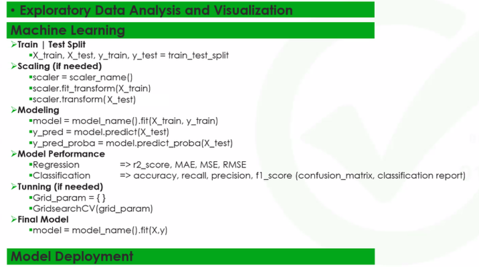

In [38]:
log_model = LogisticRegression(max_iter=5000, random_state=42)

In [39]:
penalty = ["l1", "l2"] # hata aldik bu kodda
C = np.logspace(-1, 5, 20)  # Alphanin tersi seklinde calisir
param_grid = {"penalty" : penalty,
             "C" : C}

In [50]:
penalty = ["l2"]
C = np.logspace(-1, 5, 20)
param_grid = {"penalty" : penalty,
             "C" : C}

In [51]:
grid_model = GridSearchCV(log_model, param_grid = param_grid, cv=10)

In [52]:
grid_model.fit(X_train_scaled, y_train)

GridSearchCV(cv=10,
             estimator=LogisticRegression(max_iter=5000, random_state=42),
             param_grid={'C': array([1.00000000e-01, 2.06913808e-01, 4.28133240e-01, 8.85866790e-01,
       1.83298071e+00, 3.79269019e+00, 7.84759970e+00, 1.62377674e+01,
       3.35981829e+01, 6.95192796e+01, 1.43844989e+02, 2.97635144e+02,
       6.15848211e+02, 1.27427499e+03, 2.63665090e+03, 5.45559478e+03,
       1.12883789e+04, 2.33572147e+04, 4.83293024e+04, 1.00000000e+05]),
                         'penalty': ['l2']})

In [53]:
grid_model.best_params_

{'C': 3.79269019073225, 'penalty': 'l2'}

In [54]:
grid_model.best_score_

0.9692307692307693

In [55]:
y_pred = grid_model.predict(X_test_scaled)
y_pred

array(['setosa', 'setosa', 'setosa', 'virginica', 'versicolor',
       'virginica', 'versicolor', 'versicolor', 'virginica', 'setosa',
       'virginica', 'setosa', 'setosa', 'virginica', 'virginica'],
      dtype=object)

<IPython.core.display.Javascript object>


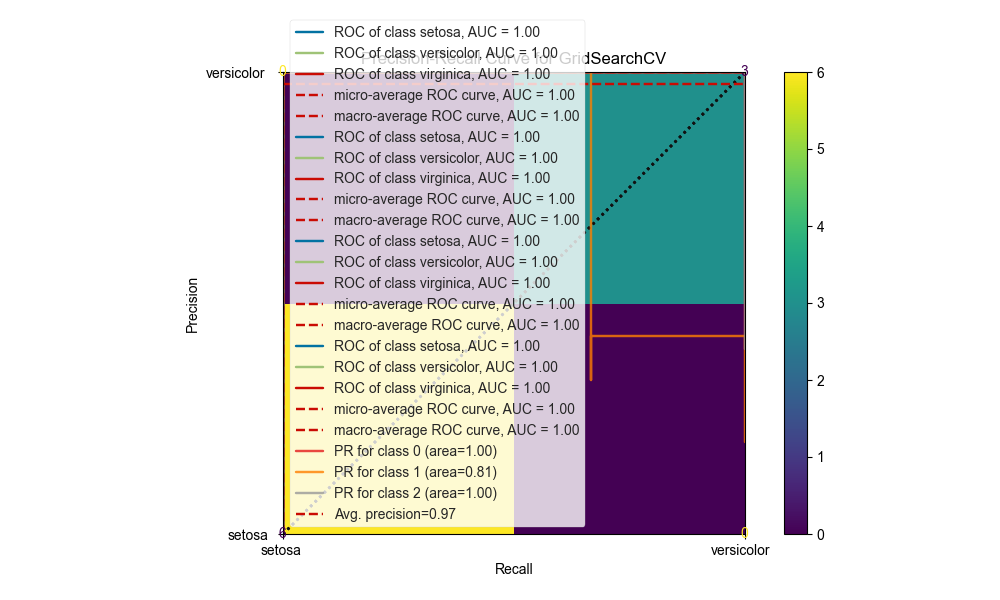

In [56]:
plot_confusion_matrix(grid_model, X_test_scaled, y_test)
plt.show()

In [57]:
eval_metric(grid_model, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[6 0 0]
 [0 3 0]
 [0 0 6]]
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00         6
  versicolor       1.00      1.00      1.00         3
   virginica       1.00      1.00      1.00         6

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15


Train_Set
[[44  0  0]
 [ 0 46  1]
 [ 0  1 43]]
              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        44
  versicolor       0.98      0.98      0.98        47
   virginica       0.98      0.98      0.98        44

    accuracy                           0.99       135
   macro avg       0.99      0.99      0.99       135
weighted avg       0.99      0.99      0.99       135



# ROC (Receiver Operating Curve) and AUC (Area Under Curve)

In [65]:
from sklearn.metrics import plot_roc_curve

In [64]:
# plot_roc_curve(grid_model, X_test_scaled, y_test); # hata veriri

In [67]:
from yellowbrick.classifier import ROCAUC
model = grid_model
visualizer = ROCAUC(model)

visualizer.fit(X_train_scaled, y_train)        # Fit the training data to the visualizer
visualizer.score(X_test_scaled, y_test)        # Evaluate the model on the test data
visualizer.show();

In [68]:
from yellowbrick.classifier import PrecisionRecallCurve
model = grid_model
viz = PrecisionRecallCurve(
    model,
    per_class=True,#buraya bunu vermezsek binary gibi çalışır.
    cmap="Set1"
)
viz.fit(X_train_scaled, y_train)
viz.score(X_test_scaled, y_test)
viz.show();

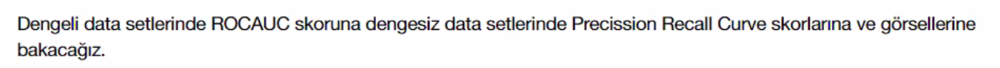

# Final Model and Model Deployment

In [69]:
scaler = StandardScaler().fit(X) #bütün datayı scale yapıyorum

In [70]:
import pickle
pickle.dump(scaler, open("scaler_iris", 'wb')) #scale modelimi kayıt ediyorum

In [71]:
X_scaled = scaler.transform(X) #sonra transform yapıyorum

In [72]:
final_model = LogisticRegression().fit(X_scaled, y)#final modelimi oluşturuyorum

In [73]:
pickle.dump(final_model, open("final_model_iris", 'wb'))#onuda kayıt ediyorum

In [74]:
X.describe().T#describe bakıyorum ki buradaki skorlara yakın skorlar verip tahmin yapacağı

,count,mean,std,min,25%,50%,75%,max
sepal_length,150.000,5.843,0.828,4.300,5.100,5.800,6.400,7.900
sepal_width,150.000,3.057,0.436,2.000,2.800,3.000,3.300,4.400
petal_length,150.000,3.758,1.765,1.000,1.600,4.350,5.100,6.900
petal_width,150.000,1.199,0.762,0.100,0.300,1.300,1.800,2.500


In [75]:
my_dict = {"sepal_length": [4.5, 5.8, 7.5],
           "sepal_width": [2.2, 3, 4.2],
           "petal_length": [1.3, 4.3, 6.5],
           "petal_width": [0.2, 1.3, 2.3]
          }

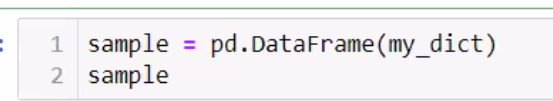

In [76]:
sample = pd.DataFrame(my_dict)
sample

,sepal_length,sepal_width,petal_length,petal_width
0,4.500,2.200,1.300,0.200
1,5.800,3.000,4.300,1.300
2,7.500,4.200,6.500,2.300


In [80]:
# print(yellowbrick.__version__)

NameError: name 'yellowbrick' is not defined

In [81]:
# import yellowbrick
print(yellowbrick.__version__)

1.5


In [82]:
# import plotly
print(plotly.__version__)

5.15.0


In [83]:
# print(.__version__)

1.23.1
